In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pathlib
import os
import glob as gb
import glob
import cv2
import tensorflow as tf

In [2]:
train_dir = '/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/'
valid_dir = '/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/'
test_dir = '/kaggle/input/new-plant-diseases-dataset/test/'

In [3]:
for folder in os.listdir(train_dir): 
    files = gb.glob(pathname=str(train_dir + '/' + folder + '/*.[jJ][pP][gG]'))
    print(f'For training data, found {len(files)} in folder {folder}')

For training data, found 1851 in folder Tomato___Late_blight
For training data, found 1926 in folder Tomato___healthy
For training data, found 1692 in folder Grape___healthy
For training data, found 2010 in folder Orange___Haunglongbing_(Citrus_greening)
For training data, found 2022 in folder Soybean___healthy
For training data, found 1736 in folder Squash___Powdery_mildew
For training data, found 1824 in folder Potato___healthy
For training data, found 1908 in folder Corn_(maize)___Northern_Leaf_Blight
For training data, found 1920 in folder Tomato___Early_blight
For training data, found 1745 in folder Tomato___Septoria_leaf_spot
For training data, found 1642 in folder Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
For training data, found 1774 in folder Strawberry___Leaf_scorch
For training data, found 1728 in folder Peach___healthy
For training data, found 2016 in folder Apple___Apple_scab
For training data, found 1961 in folder Tomato___Tomato_Yellow_Leaf_Curl_Virus
For traini

In [4]:
size=224
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

train_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=0,
    width_shift_range=0.0,
    height_shift_range=0.0,
    shear_range=0.0,
    zoom_range=0.0,
    horizontal_flip=False,
    vertical_flip=False,
    rescale=1/255.0,
    preprocessing_function=None,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=64,
                      target_size=(size,size),
                      subset="training",
                      color_mode='rgb', #"rgb", "rgba", or "grayscale"
                      class_mode='categorical',  # Use 'binary', 'sparse','categorical' or None as needed
                      shuffle=True)

Found 63282 images belonging to 38 classes.


In [5]:
train_generator.class_indices

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

In [6]:
train_generator.class_indices.keys()

dict_keys(['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato__

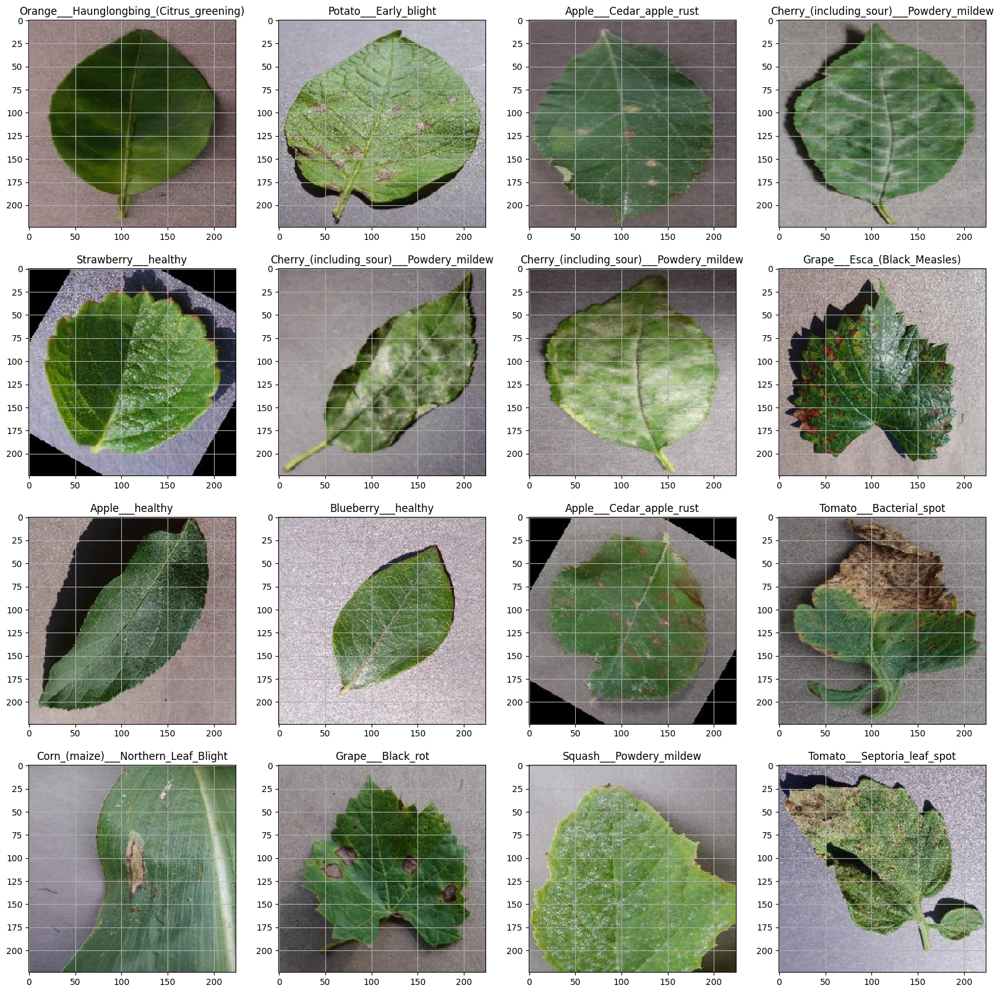

In [7]:
classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
    # create a grid of 3x3 images
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])   # when y is categorical
        # plt.title(classes[int(y_batch[i])])   # when y is binary or sparse 
        plt.grid(None)
    # show the plot
    plt.show()
    break

In [8]:
valid_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    preprocessing_function=None,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=64,
                      target_size=(size,size),
                      subset='validation',
                      color_mode='rgb', #"rgb", "rgba", or "grayscale"
                      class_mode='categorical',  # Use 'binary', 'sparse','categorical' or None as needed
                      shuffle=False)

Found 7013 images belonging to 38 classes.


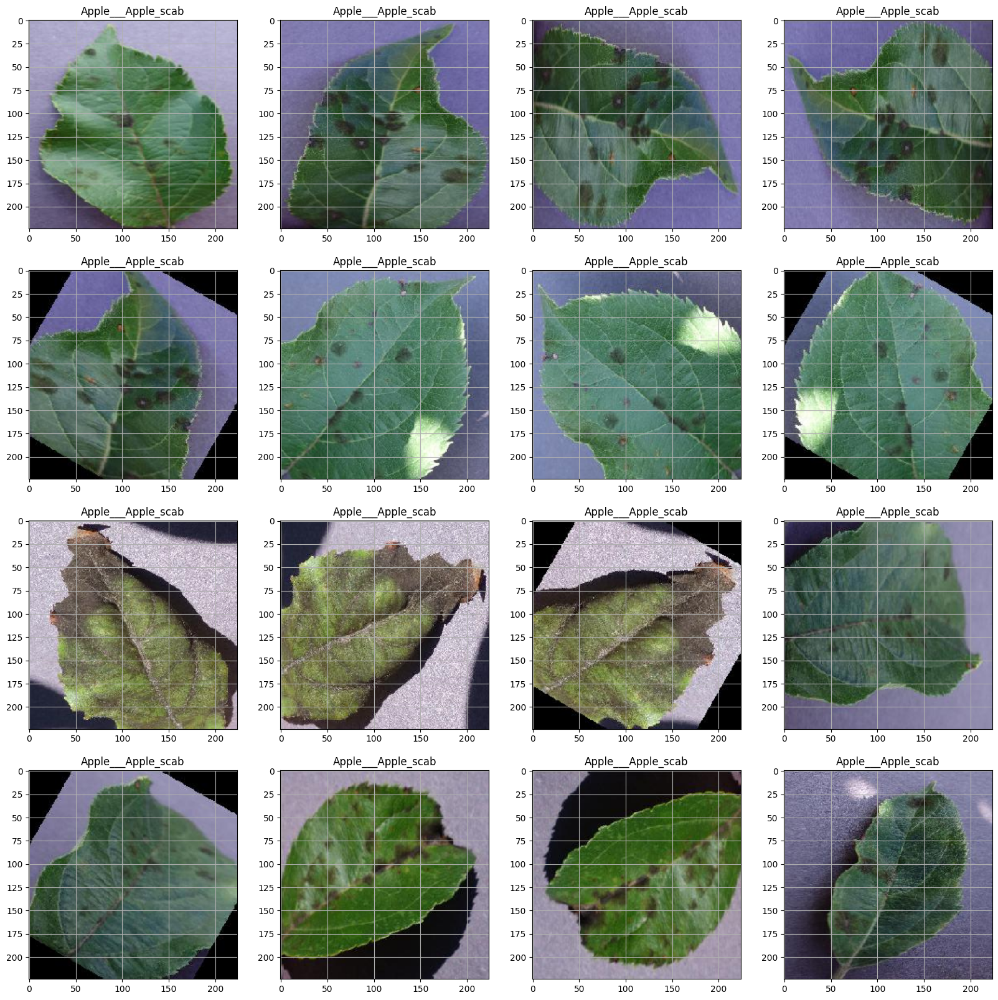

In [9]:
classes=list(valid_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in valid_generator:
    # create a grid of 3x3 images
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])   # when y is categorical
        # plt.title(classes[int(y_batch[i])])   # when y is binary or sparse 
        plt.grid(None)
    # show the plot
    plt.show()
    break

In [10]:
test_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    preprocessing_function=None
).flow_from_directory(valid_dir,
                      batch_size=64,
                      target_size=(size,size),
                      color_mode='rgb', 
                      class_mode = 'categorical',  
                      shuffle=False)

Found 17572 images belonging to 38 classes.


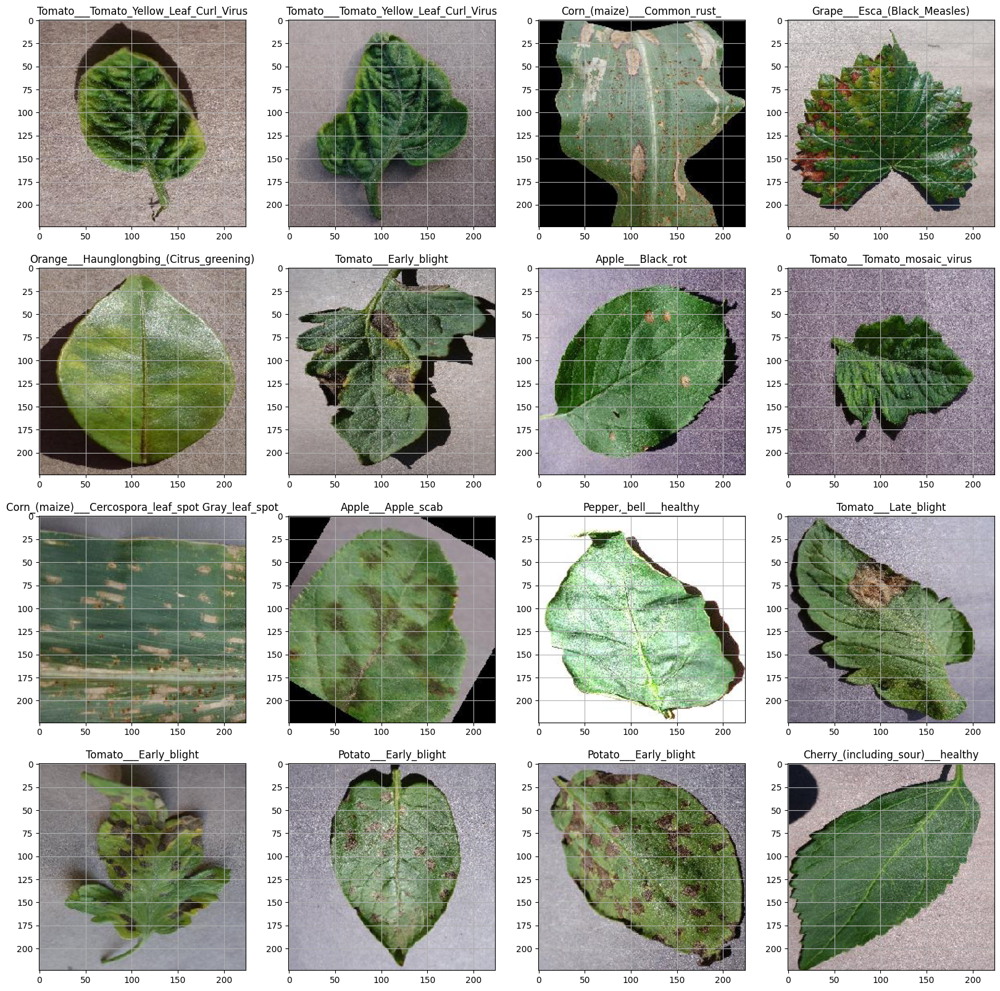

In [11]:
classes=list(valid_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
    # create a grid of 3x3 images
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])   
        plt.grid(None)
    plt.show()
    break

In [12]:
from tensorflow import keras
model = keras.models.Sequential()

model.add(keras.layers.Conv2D(filters=64, kernel_size=7, strides=1, 
                padding="same", activation=keras.layers.LeakyReLU(alpha=0.02), name="Conv1", input_shape= (224,224,3)))
model.add(keras.layers.MaxPool2D(pool_size=2, name="Pool1"))
model.add(keras.layers.Conv2D(filters=128, kernel_size=5, strides=1, 
                padding="same", activation=keras.layers.LeakyReLU(alpha=0.02), name="Conv2"))
model.add(keras.layers.MaxPool2D(pool_size=2, name="Pool2"))
model.add(keras.layers.Conv2D(filters=256, kernel_size=3, strides=1, 
                padding="same", activation=keras.layers.LeakyReLU(alpha=0.02), name="Conv3"))
model.add(keras.layers.MaxPool2D(pool_size=2, name="Pool3"))

model.add(keras.layers.Flatten(name="Flatten1"))
model.add(keras.layers.Dense(128, activation=keras.layers.LeakyReLU(alpha=0.02), name="Dense1"))
model.add(keras.layers.Dense(64, activation=keras.layers.LeakyReLU(alpha=0.02), name="Dense2"))
model.add(keras.layers.Dense(38, activation="softmax", name="Output"))

print(model.summary())


/opt/conda/lib/python3.10/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Conv1 (Conv2D)                  │ (None, 224, 224, 64)   │         9,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool1 (MaxPooling2D)            │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2 (Conv2D)                  │ (None, 112, 112, 128)  │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool2 (MaxPooling2D)            │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv3 (Conv2D)                  │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool3 (MaxPooling2D)            │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten1 (Flatten)              │ (None, 200704)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense1 (Dense)                  │ (None, 128)            │    25,690,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense2 (Dense)                  │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 38)             │         2,470 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,210,534 (99.99 MB)

 Trainable params: 26,210,534 (99.99 MB)

 Non-trainable params: 0 (0.00 B)

None


In [23]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=15, min_lr=0.000001)

callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

In [24]:
# Compiling the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)

model.compile(loss="categorical_crossentropy", optimizer= optimizer, metrics=["accuracy",'precision','recall'])

In [25]:
# Now you can train the model
history = model.fit(train_generator,
                    epochs=15,
                    validation_data=valid_generator,
                    callbacks=callbacks)

Epoch 1/15
989/989 ━━━━━━━━━━━━━━━━━━━━ 314s 313ms/step - accuracy: 0.9176 - loss: 0.2541 - precision: 0.9319 - recall: 0.9073 - val_accuracy: 0.8996 - val_loss: 0.3507 - val_precision: 0.9114 - val_recall: 0.8901 - learning_rate: 0.0010
Epoch 2/15
989/989 ━━━━━━━━━━━━━━━━━━━━ 306s 308ms/step - accuracy: 0.9421 - loss: 0.1790 - precision: 0.9502 - recall: 0.9359 - val_accuracy: 0.8694 - val_loss: 0.4643 - val_precision: 0.8879 - val_recall: 0.8558 - learning_rate: 0.0010
Epoch 3/15
989/989 ━━━━━━━━━━━━━━━━━━━━ 307s 310ms/step - accuracy: 0.9590 - loss: 0.1241 - precision: 0.9643 - recall: 0.9552 - val_accuracy: 0.8909 - val_loss: 0.4276 - val_precision: 0.8990 - val_recall: 0.8861 - learning_rate: 0.0010
Epoch 4/15
989/989 ━━━━━━━━━━━━━━━━━━━━ 308s 310ms/step - accuracy: 0.9610 - loss: 0.1303 - precision: 0.9647 - recall: 0.9583 - val_accuracy: 0.9065 - val_loss: 0.3814 - val_precision: 0.9136 - val_recall: 0.9030 - learning_rate: 0.0010
Epoch 5/15
989/989 ━━━━━━━━━━━━━━━━━━━━ 306s 308

In [26]:
#evlaute the model for tranning
model_evaluate=model.evaluate(train_generator)
print('loss : ',model_evaluate[0])
print('Accuracy : ',model_evaluate[1])
print('precision : ',model_evaluate[2])
print('Recall : ',model_evaluate[3])

989/989 ━━━━━━━━━━━━━━━━━━━━ 150s 152ms/step - accuracy: 0.9960 - loss: 0.0185 - precision: 0.9964 - recall: 0.9956
loss :  0.018921414390206337
Accuracy :  0.9959862232208252
precision :  0.9963937401771545
Recall :  0.9954647421836853


In [27]:
#evlaute the model for valid
model_evaluate=model.evaluate(valid_generator)
print('loss : ',model_evaluate[0])
print('Accuracy : ',model_evaluate[1])
print('precision : ',model_evaluate[2])
print('Recall : ',model_evaluate[3])

110/110 ━━━━━━━━━━━━━━━━━━━━ 19s 170ms/step - accuracy: 0.9339 - loss: 0.2399 - precision: 0.9396 - recall: 0.9300
loss :  0.3426637053489685
Accuracy :  0.9080279469490051
precision :  0.9166425466537476
Recall :  0.9031798243522644


In [28]:
#evlaute the model for testing
model_evaluate=model.evaluate(test_generator)
print('loss : ',model_evaluate[0])
print('Accuracy : ',model_evaluate[1])
print('precision : ',model_evaluate[2])
print('Recall : ',model_evaluate[3])

275/275 ━━━━━━━━━━━━━━━━━━━━ 133s 485ms/step - accuracy: 0.9347 - loss: 0.2417 - precision: 0.9421 - recall: 0.9309
loss :  0.31464412808418274
Accuracy :  0.9172547459602356
precision :  0.9256823062896729
Recall :  0.9129865765571594


In [29]:
predictions=model.predict(test_generator)

275/275 ━━━━━━━━━━━━━━━━━━━━ 50s 180ms/step


classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.89      0.92      0.91       504
                                 Apple___Black_rot       0.95      0.95      0.95       497
                          Apple___Cedar_apple_rust       0.96      0.96      0.96       440
                                   Apple___healthy       0.83      0.94      0.88       502
                               Blueberry___healthy       0.95      0.92      0.94       454
          Cherry_(including_sour)___Powdery_mildew       0.98      0.90      0.94       421
                 Cherry_(including_sour)___healthy       0.95      0.97      0.96       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.92      0.83      0.87       410
                       Corn_(maize)___Common_rust_       0.99      0.99      0.99       477
               Corn_(maize)___Northern_Leaf_Blight   

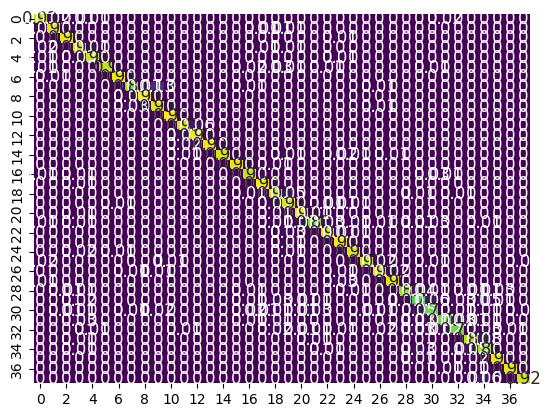

In [31]:
import seaborn as sns

#confusion matrix
y_pred=predictions.argmax(axis=-1)

train_generator.class_indices.keys()

#compute classification report

from sklearn.metrics import classification_report,confusion_matrix
print('classification report : \n',classification_report(test_generator.labels,y_pred,target_names=train_generator.class_indices.keys()))

#function to draw confusion matrix
def draw_confusion_matrix(true,preds,normalize=None):
    #compute confusion matrix
    conf_matx=confusion_matrix(true,preds,normalize=normalize)
    conf_matx=np.round(conf_matx,2)
    sns.heatmap(conf_matx,annot=True,annot_kws={'size':12},fmt='g',cbar=False,cmap='viridis')
    plt.show()
    
print('Confusion matrix : \n')
draw_confusion_matrix(test_generator.labels,y_pred,'true')